In [1]:
import pandas as pd
import ast
from sklearn.manifold import TSNE
import itertools
from collections import Counter
import numpy as np
import matplotlib.pyplot as plt

In [2]:
events_df = pd.read_csv('grad_cam_2f_events_correct_predictions.csv')
# events_df = pd.read_csv('grad_cam_plus_2f_events_correct_predictions.csv')
events_df = events_df.drop("Unnamed: 0", axis=1)
events_df.shape

(2230, 7)

In [3]:
np.unique(events_df['Actual Label'])

array(['airport', 'bus', 'metro', 'metro_station', 'park',
       'public_square', 'shopping_mall', 'street_pedestrian',
       'street_traffic', 'tram'], dtype=object)

In [4]:
events_df.head()

,Filename,Predicted Label,Actual Label,events_before,events_after,cam_pred_labels,not_common
0,/work/aistwal/dataset_tau2019/extracted-files/...,street_pedestrian,street_pedestrian,"['Speech', 'Clip-clop', 'Animal', 'Run', 'Hors...","['Speech', 'Animal', 'Clip-clop', 'Horse', 'Ru...",street_pedestrian,"{'Walk, footsteps'}"
1,/work/aistwal/dataset_tau2019/extracted-files/...,metro,metro,"['Train', 'Rail transport', 'Vehicle', 'Railro...","['Vehicle', 'Train', 'Car', 'Music', 'Speech',...",metro,"{'Subway, metro, underground', 'Outside, rural..."
2,/work/aistwal/dataset_tau2019/extracted-files/...,street_pedestrian,street_pedestrian,"['Speech', 'Music', 'Vehicle', 'Chatter', 'Out...","['Speech', 'Music', 'Vehicle', 'Outside, urban...",street_pedestrian,"{'Inside, large room or hall', 'Crowd', 'Chatt..."
3,/work/aistwal/dataset_tau2019/extracted-files/...,street_traffic,street_traffic,"['Vehicle', 'White noise', 'Silence', 'Car', '...","['Vehicle', 'Car', 'Speech', 'Silence', 'Outsi...",street_traffic,"{'Train', 'Mouse', 'Rustle'}"
4,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"['Speech', 'Clip-clop', 'Horse', 'Animal', 'Ru...","['Speech', 'Clip-clop', 'Horse', 'Animal', 'Ge...",airport,"{'Outside, urban or manmade'}"


In [5]:
label_counts = events_df['Actual Label'].value_counts()
label_counts

Actual Label
street_traffic       359
street_pedestrian    305
tram                 298
airport              280
metro                209
park                 176
bus                  159
metro_station        152
public_square        147
shopping_mall        145
Name: count, dtype: int64

In [6]:
# All events list are stored as string, convert them to list 
events_df['events_before'] = events_df['events_before'].apply(ast.literal_eval)
events_df['events_after'] = events_df['events_after'].apply(ast.literal_eval)

In [7]:
#Get unique events

all_events_before = []
# Flatten the list of lists to a single list of events
all_events = [event for sublist in events_df['events_before'] for event in sublist if len(sublist) == 10]

# Get unique events
unique_events = set(all_events)
print("Total number of unique events before: ", len(unique_events))
# print("Unique events:", unique_events)

Total number of unique events before:  265


In [8]:
#Get unique events_after
# Flatten the list of lists to a single list of events
all_events = [event for sublist in events_df['events_after'] for event in sublist]

# Get unique events
unique_events_after = set(all_events)
print("Total number of unique events_after: ", len(unique_events_after))
# print("Unique events:", unique_events_after)

Total number of unique events_after:  245


In [9]:
final_events = set(list(unique_events)+list(unique_events_after))

In [10]:
len(final_events)

288

In [11]:
final_events_list = list(final_events)
import re
def preprocess_event(event):
    # Convert to lowercase
    event = event.lower()
    
    # Replace special characters with space
    event = re.sub(r'[^\w\s]', ' ', event)
    
    # Tokenize and join back
    event = ' '.join(event.split())
    
    return event

# Preprocess events
final_events_list = [preprocess_event(event) for event in final_events_list]
final_events_list

['canidae dogs wolves',
 'door',
 'quack',
 'train whistle',
 'inside public space',
 'guitar',
 'telephone bell ringing',
 'frying food',
 'snake',
 'tick',
 'gong',
 'hiccup',
 'throbbing',
 'typing',
 'camera',
 'cluck',
 'ding',
 'bird',
 'dog',
 'meow',
 'whip',
 'rail transport',
 'engine',
 'ambulance siren',
 'snicker',
 'drip',
 'boat water vehicle',
 'goat',
 'rowboat canoe kayak',
 'singing bowl',
 'sine wave',
 'narration monologue',
 'baby cry infant cry',
 'noise',
 'burst pop',
 'animal',
 'motor vehicle road',
 'pigeon dove',
 'clock',
 'bell',
 'television',
 'cat',
 'slap smack',
 'crowd',
 'glass',
 'sewing machine',
 'sizzle',
 'power windows electric windows',
 'male speech man speaking',
 'hoot',
 'gunshot gunfire',
 'explosion',
 'breathing',
 'inside small room',
 'machine gun',
 'whoosh swoosh swish',
 'musical instrument',
 'aircraft',
 'air conditioning',
 'inside large room or hall',
 'wind noise microphone',
 'basketball bounce',
 'foghorn',
 'truck',
 'tic

### Audios with no event difference before and after cam.

In [34]:
emptyset = events_df[events_df['not_common'] == 'set()']
emptyset.shape

(200, 7)

In [35]:
emptyset.head()

,Filename,Predicted Label,Actual Label,events_before,events_after,cam_pred_labels,not_common
0,/work/aistwal/dataset_tau2019/extracted-files/...,street_pedestrian,street_pedestrian,"[Speech, Clip-clop, Animal, Run, Horse, Outsid...","[Speech, Clip-clop, Animal, Run, Horse, Outsid...",street_pedestrian,set()
10,/work/aistwal/dataset_tau2019/extracted-files/...,metro_station,metro_station,"[Speech, Vehicle, Train, Rail transport, Mouse...","[Speech, Vehicle, Train, Rail transport, Mouse...",metro_station,set()
18,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Speech, Animal, Clip-clop, Arrow, Horse, Vehi...","[Speech, Animal, Clip-clop, Arrow, Horse, Vehi...",airport,set()
32,/work/aistwal/dataset_tau2019/extracted-files/...,street_pedestrian,street_pedestrian,"[Speech, Horse, Clip-clop, Animal, Neigh, whin...","[Speech, Horse, Clip-clop, Animal, Neigh, whin...",street_pedestrian,set()
41,/work/aistwal/dataset_tau2019/extracted-files/...,park,park,"[Speech, Animal, Bird, Outside, rural or natur...","[Speech, Animal, Bird, Outside, rural or natur...",park,set()


In [36]:
# Check distribution of scenes for the specified list
distribution = emptyset.groupby('Actual Label')['Filename'].count().to_frame()
distribution

,Filename
Actual Label,
airport,45
bus,6
metro,10
metro_station,9
park,35
public_square,12
shopping_mall,15
street_pedestrian,36
street_traffic,1


In [37]:
distribution['Original_Count'] = label_counts

In [38]:
distribution

,Filename,Original_Count
Actual Label,,
airport,45,280
bus,6,159
metro,10,209
metro_station,9,152
park,35,176
public_square,12,147
shopping_mall,15,145
street_pedestrian,36,305
street_traffic,1,359


/tmp/ipykernel_1342168/2716215193.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




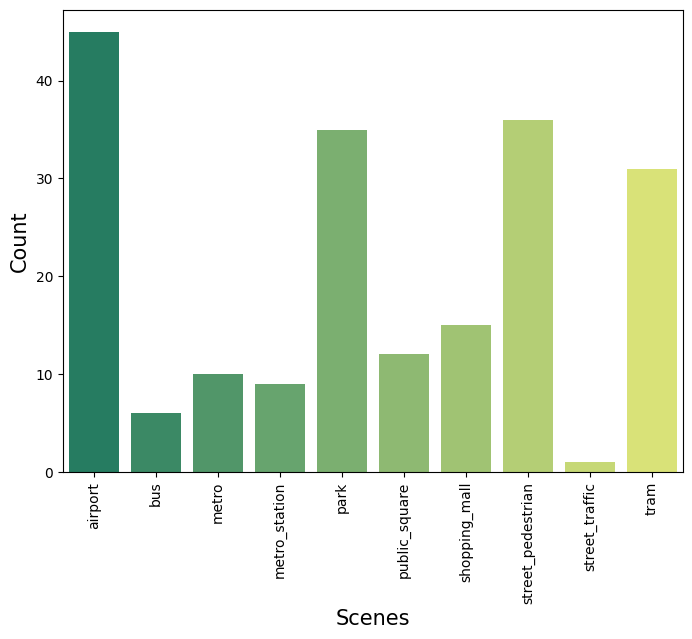

In [64]:
# Defining the plotsize
import seaborn as sns

plt.figure(figsize=(8, 6))

sns.barplot(data=distribution, x = 'Actual Label', y = 'Filename', palette="summer")
plt.xlabel("Scenes", size=15)
plt.ylabel("Count", size=15)
plt.xticks(rotation=90)
plt.savefig('grad_cam_plus_2f_emptysets.png')
plt.show()

Highest focus on background information is for street and park, since there might not be that differential events.

#### Checking the audios with same set of events

In [18]:
audio_list = emptyset[emptyset['Actual Label'] == 'street_traffic'][['Filename','events_before','events_after']]

In [19]:
audio_list

,Filename,events_before,events_after


In [20]:
audio_name = audio_list['Filename'].iloc[0]
audio_name

IndexError: single positional indexer is out-of-bounds

In [198]:
from IPython.display import Audio
import librosa

y, sr = librosa.load(audio_name, sr = 32000)
Audio(data=y, rate=sr)

In [199]:
audio_list.iloc[0]['events_before']

['Silence',
 'Vehicle',
 'White noise',
 'Outside, rural or natural',
 'Music',
 'Speech',
 'Animal',
 'Inside, small room',
 'Outside, urban or manmade',
 'Car']

In [200]:
audio_list.iloc[0]['events_after']

['Silence',
 'Vehicle',
 'Music',
 'Speech',
 'Car',
 'Animal',
 'Inside, small room',
 'Outside, rural or natural',
 'White noise',
 'Outside, urban or manmade']

In [202]:
# in general what are the events for which the set does not remain empty for metro?
st = events_df[events_df['Actual Label'] == 'street_traffic']
st.head()
st.iloc[4]['Filename'], st.iloc[4]['events_before'], st.iloc[4]['events_after'], st.iloc[4]['not_common']

('/work/aistwal/dataset_tau2019/extracted-files/TAU-urban-acoustic-scenes-2019-development/audio/street_traffic-prague-1193-44163-a.wav',
 ['Vehicle',
  'Car',
  'Silence',
  'Outside, rural or natural',
  'Whoosh, swoosh, swish',
  'Speech',
  'White noise',
  'Rustle',
  'Music',
  'Animal'],
 ['Vehicle',
  'Car',
  'Animal',
  'Outside, urban or manmade',
  'Speech',
  'Car passing by',
  'Music',
  'Whoosh, swoosh, swish',
  'White noise',
  'Explosion'],
 "{'Rustle', 'Silence', 'Outside, rural or natural'}")

In [25]:
from IPython.display import Audio
import librosa

audio_name = '/work/aistwal/dataset_tau2019/extracted-files/TAU-urban-acoustic-scenes-2019-development/audio/metro-lyon-1206-44172-a.wav'
y, sr = librosa.load(audio_name, sr = 32000)
Audio(data=y, rate=sr)

In [26]:
from collections import Counter
metro_common_list = ['Train',
  'Vehicle',
  'Rail transport',
  'Railroad car, train wagon',
  'Speech',
  'Subway, metro, underground',
  'Outside, urban or manmade',
  'Field recording',
  'Clickety-clack',
  'Outside, rural or natural']
exceptlist = []
for s in metro['not_common']:
    s = ast.literal_eval(s)
    for everyevent in s:
        if everyevent not in metro_common_list:
            exceptlist.append(everyevent)
Counter(exceptlist)

Counter({'Aircraft': 77,
         'Fixed-wing aircraft, airplane': 59,
         'Ship': 37,
         'Boat, Water vehicle': 19,
         'Train wheels squealing': 17,
         'Inside, small room': 16,
         'Cupboard open or close': 9,
         'Music': 8,
         'Animal': 8,
         'Train horn': 8,
         'Bus': 5,
         'Thump, thud': 5,
         'Clip-clop': 5,
         'Thunk': 5,
         'Mouse': 5,
         'Bird': 4,
         'Musical instrument': 4,
         'Female speech, woman speaking': 4,
         'Rumble': 4,
         'Door': 3,
         'Microwave oven': 3,
         'Pigeon, dove': 3,
         'Inside, large room or hall': 3,
         'Domestic animals, pets': 3,
         'Child speech, kid speaking': 3,
         'Doorbell': 3,
         'Air brake': 3,
         'Power windows, electric windows': 3,
         'Narration, monologue': 3,
         'Telephone': 3,
         'Traffic noise, roadway noise': 2,
         'Crow': 2,
         'Singing bowl': 2,
        

### Bert

In [11]:
# #BERT
# import torch
# from transformers import BertTokenizer, BertModel
# import numpy as np

# # Load pre-trained BERT tokenizer and model
# tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
# model = BertModel.from_pretrained('bert-base-uncased')

# # Function to get BERT embeddings for a single event
# def get_bert_embedding(event, tokenizer, model):
#     inputs = tokenizer(event, return_tensors='pt')
#     with torch.no_grad():
#         outputs = model(**inputs)
#     # Take the mean of the token embeddings to get a single vector for the event
#     embedding = torch.mean(outputs.last_hidden_state, dim=1).squeeze()
#     return embedding.numpy()

In [12]:
# # Get embeddings for preprocessed events
# embeddings = {event: get_bert_embedding(event, tokenizer, model) for event in final_events_list}

In [13]:
# # Example: Checking the cosine similarity between two preprocessed event embeddings
# from sklearn.metrics.pairwise import cosine_similarity

# event1 = 'cricket'
# event2 = 'aircraft'

# embedding1 = embeddings[event1]
# embedding2 = embeddings[event2]

# similarity = cosine_similarity([embedding1], [embedding2])[0][0]

# print(f"Cosine similarity between '{event1}' and '{event2}': {similarity:.3f}")

### Word2Vec

In [31]:
'''
HAS PROBLEMS WITH PHRASES
'''

# using pretrained model
import gensim
model = gensim.models.KeyedVectors.load_word2vec_format('/work/aistwal/MMDS_MasterThesis/models/asc/wordvectors/GoogleNews-vectors-negative300.bin', binary=True)

In [38]:
len(model['shufflingcards'])

KeyError: "Key 'shufflingcards' not present"

### FastTEXT

In [65]:
from gensim.models import KeyedVectors

fasttext_file = '/work/aistwal/MMDS_MasterThesis/models/asc/wordvectors/wiki-news-300d-1M-subword.vec'
fasttext_model = KeyedVectors.load_word2vec_format(fasttext_file)

In [66]:
import fasttext

# Load the FastText model using the fasttext library for OOV handling
# Download the bin file from https://fasttext.cc/docs/en/crawl-vectors.html if not already done
fasttext_bin_file = '/work/aistwal/MMDS_MasterThesis/models/asc/wordvectors/cc.en.300.bin'
fasttext_fallback_model = fasttext.load_model(fasttext_bin_file)

primary_embeddings = []
fallback_embeddings = []
def get_word_embedding(word, model, fallback_model):
    if word in model:
        primary_embeddings.append(model[word])
        # return model[word] #Commenting out as the embeddings are getting clustered separately
        return fallback_model.get_word_vector(word)
    else:
        # Use FastText subword information for OOV terms
        fallback_embeddings.append(fallback_model.get_word_vector(word))
        return fallback_model.get_word_vector(word)

embedding_list = []
for event in final_events_list:
    embedding = get_word_embedding(event, fasttext_model, fasttext_fallback_model)
    embedding_list.append(embedding)


In [67]:
type(fallback_embeddings[0]), len(fallback_embeddings[0]),len(primary_embeddings[0]), fallback_embeddings[0].shape

(numpy.ndarray, 300, 300, (300,))

In [68]:
final_events_list

['duck',
 'thunderstorm',
 'single lens reflex camera',
 'mechanical fan',
 'coo',
 'chirp tone',
 'music',
 'tick tock',
 'rain',
 'change ringing campanology',
 'noise',
 'chewing mastication',
 'chuckle chortle',
 'ambulance siren',
 'insect',
 'helicopter',
 'rowboat canoe kayak',
 'livestock farm animals working animals',
 'bell',
 'chink clink',
 'fireworks',
 'alarm clock',
 'accelerating revving vroom',
 'thunk',
 'cluck',
 'typewriter',
 'shuffling cards',
 'wild animals',
 'wind chime',
 'keys jangling',
 'clicking',
 'telephone',
 'clang',
 'snort',
 'child singing',
 'medium engine mid frequency',
 'clip clop',
 'animal',
 'tick',
 'rattle',
 'air brake',
 'boom',
 'mouse',
 'canidae dogs wolves',
 'meow',
 'glockenspiel',
 'ding',
 'gobble',
 'ping',
 'scary music',
 'motorboat speedboat',
 'applause',
 'cupboard open or close',
 'smoke detector smoke alarm',
 'frog',
 'hiccup',
 'drawer open or close',
 'aircraft engine',
 'inside small room',
 'engine',
 'cat',
 'baby cr

In [57]:
final_events_list.index('gasp'), final_events_list.index('microwave oven') #Cosine similarity: -0.0048
final_events_list.index('rowboat canoe kayak'), final_events_list.index('car passing by') #Cosine similarity: 0.2
final_events_list.index('rowboat canoe kayak'), final_events_list.index('motorboat speedboat') #Cosine similarity: 0.61
final_events_list.index('whimper dog'), final_events_list.index('dog') #Cosine similarity: 0.071

(191, 237)

In [58]:
len(embedding_list), len(embedding_list[0])

(294, 300)

In [59]:
from scipy.spatial.distance import cosine

def cosine_similarity(embedding_1, embedding_2):
    # Calculate the cosine similarity of the two embeddings.
    sim = 1 - cosine(embedding_1, embedding_2)
    print('Cosine similarity: {:.2}'.format(sim))

cosine_similarity(embedding_list[127], embedding_list[165])

Cosine similarity: 0.32


In [69]:
# Create DataFrame
embedding_df = pd.DataFrame({
    "Events": final_events_list,
    "Embedding": embedding_list
})
embedding_df

,Events,Embedding
0,duck,"[0.052107256, -0.029290637, -0.006297646, 0.19..."
1,thunderstorm,"[-0.003233472, -0.03361534, 0.00807929, 0.0424..."
2,single lens reflex camera,"[0.002708624, 0.0074248114, -0.009082709, 0.02..."
3,mechanical fan,"[0.013433072, -0.0117505565, -0.019781347, 0.0..."
4,coo,"[0.32486528, -0.08002096, -0.041017085, 0.0863..."
...,...,...
283,inside public space,"[-0.001420811, 0.006018144, -0.0050916127, 0.0..."
284,motor vehicle road,"[0.0033013716, 0.020077378, 0.020911295, 0.037..."
285,telephone dialing dtmf,"[0.00019407496, -0.016042257, -0.0070417426, 0..."
286,drum,"[-0.03162603, 0.0040680594, 0.003363325, 0.244..."


In [61]:
embedding_df['Embedding'].values[0].shape

(300,)

In [70]:
#perform tsne
import time
import numpy as np
from sklearn.decomposition import PCA

data_matrix = np.stack(embedding_df['Embedding'].values)

time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=30, n_iter=300)
tsne_results = tsne.fit_transform(data_matrix)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 288 samples in 0.000s...
[t-SNE] Computed neighbors for 288 samples in 0.171s...
[t-SNE] Computed conditional probabilities for sample 288 / 288
[t-SNE] Mean sigma: 0.141079
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.647728
[t-SNE] KL divergence after 300 iterations: 1.148435
t-SNE done! Time elapsed: 1.1822340488433838 seconds


In [71]:
embedding_df['tsne-2d-one'] = tsne_results[:,0]
embedding_df['tsne-2d-two'] = tsne_results[:,1]

In [64]:
# embedding_df.head()
# embedding_df.loc[embedding_df['Events'] == 'whispering', 'tsne-2d-one'].item()

In [65]:
type(embedding_df['Embedding'][0]), embedding_df['Embedding'].values[0].shape

(numpy.ndarray, (300,))

In [72]:
embedding_df.to_csv("event_embeddings_gradcamplus.csv")

In [12]:
# stored_embedding_df = pd.read_csv('event_embeddings.csv').drop("Unnamed: 0", axis = 1 )
stored_embedding_df = pd.read_csv('event_embeddings_gradcamplus.csv').drop("Unnamed: 0", axis = 1 )
stored_embedding_df['Embedding'] = stored_embedding_df['Embedding'].map(lambda x: x.replace("[ ","[").replace(" ]","]"))
# Split and join the string values
stored_embedding_df['Embedding'] = stored_embedding_df['Embedding'].apply(lambda x: ','.join(x.split()))
stored_embedding_df['Embedding'] = stored_embedding_df['Embedding'].apply(ast.literal_eval).apply(np.array)
# embedding_df['Embedding'].apply(ast.literal_eval)
stored_embedding_df.head()

,Events,Embedding,tsne-2d-one,tsne-2d-two
0,duck,"[0.0521072559, -0.029290637, -0.00629764609, 0...",1.787487,4.872028
1,thunderstorm,"[-0.00323347, -0.03361534, 0.00807929, 0.04240...",8.108960,2.702910
2,single lens reflex camera,"[0.00270862, 0.00742481, -0.00908271, 0.027676...",-2.305975,-1.369742
3,mechanical fan,"[0.0134330718, -0.0117505565, -0.0197813474, 0...",-6.491867,-0.363055
4,coo,"[0.32486528, -0.08002096, -0.04101709, 0.08638...",-2.531985,11.977270


In [13]:
type(stored_embedding_df['Embedding'][0]), stored_embedding_df['Embedding'].values[0].shape

(numpy.ndarray, (300,))

In [14]:
# embedding_df[embedding_df['Events'] == 'clip clop']

In [15]:
stored_embedding_df[stored_embedding_df['Events'] == 'clip clop']

,Events,Embedding,tsne-2d-one,tsne-2d-two
36,clip clop,"[-0.0270164907, -0.0507147834, -0.00280965609,...",-5.714009,-1.359867


In [16]:
embedding_df = stored_embedding_df

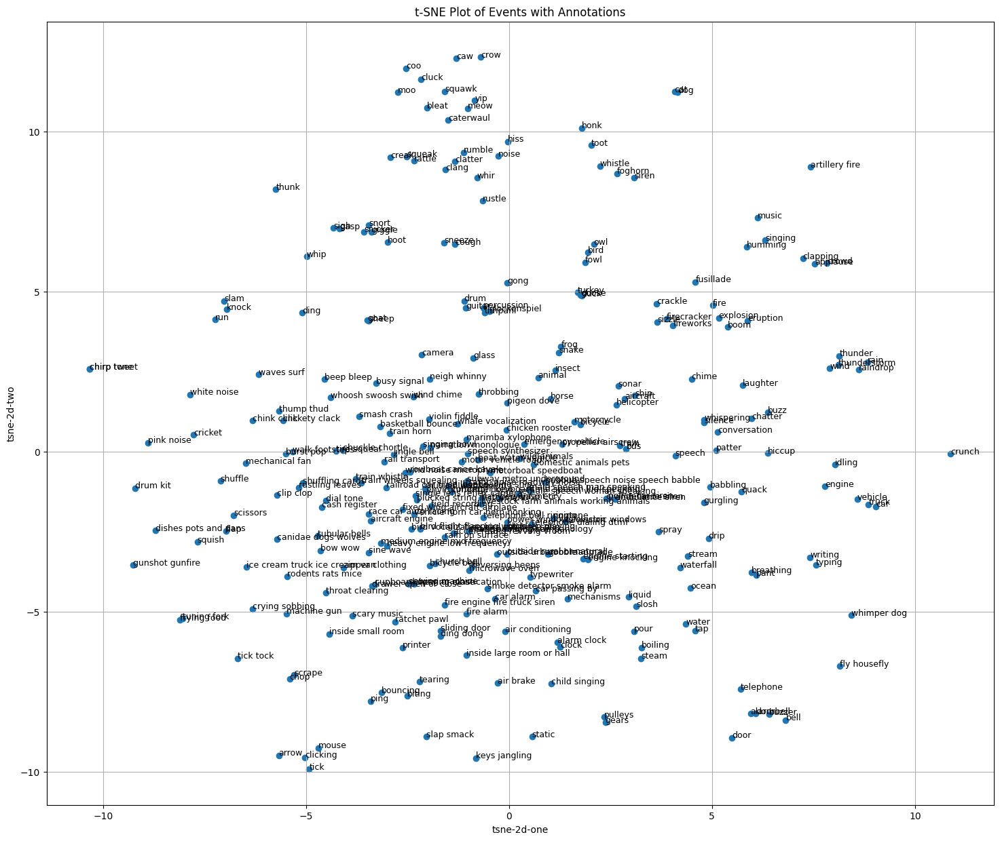

In [17]:
import matplotlib.pyplot as plt
# Plotting
plt.figure(figsize=(18, 15))
plt.scatter(embedding_df['tsne-2d-one'], embedding_df['tsne-2d-two'], marker='o')

# Annotating each point with the event name
for i, event in embedding_df.iterrows():
    plt.annotate(event['Events'], (event['tsne-2d-one'], event['tsne-2d-two']), fontsize=9)

plt.title('t-SNE Plot of Events with Annotations')
plt.xlabel('tsne-2d-one')
plt.ylabel('tsne-2d-two')
plt.savefig('t-SNE_event_plot.png')
plt.grid(True)

## AIRPORT-EVENT

In [21]:
# Now groupwise representing important events for the scene
airport_df = events_df.groupby("Predicted Label").get_group("airport")
print(airport_df.shape)
airport_df.head()
airport_df[airport_df['cam_pred_labels'] == 'airport']

(280, 7)


,Filename,Predicted Label,Actual Label,events_before,events_after,cam_pred_labels,not_common
4,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Speech, Clip-clop, Horse, Animal, Run, Vehicl...","[Speech, Clip-clop, Horse, Animal, Gears, Mech...",airport,"{'Outside, urban or manmade'}"
7,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Speech, Clip-clop, Horse, Animal, Vehicle, Ru...","[Speech, Clip-clop, Horse, Animal, Vehicle, Ru...",airport,{'Mouse'}
9,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Speech, Animal, Clip-clop, Horse, Vehicle, In...","[Speech, Outside, urban or manmade, Animal, Ve...",airport,"{'Mouse', 'Male speech, man speaking'}"
18,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Speech, Animal, Clip-clop, Arrow, Horse, Vehi...","[Speech, Animal, Clip-clop, Arrow, Horse, Vehi...",airport,set()
19,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Speech, Male speech, man speaking, Narration,...","[Speech, Male speech, man speaking, Animal, Mu...",airport,"{'Mouse', 'Female speech, woman speaking'}"
...,...,...,...,...,...,...,...
1059,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Speech, Animal, Music, Chink, clink, Inside, ...","[Speech, Chink, clink, Music, Animal, Silence,...",airport,"{'Vehicle', 'Tick-tock', 'Musical instrument'}"
1060,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Animal, Horse, Clip-clop, Speech, Neigh, whin...","[Speech, Animal, Horse, Clip-clop, Neigh, whin...",airport,"{'Cat', 'Inside, small room', 'Music'}"
1061,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Speech, Clip-clop, Horse, Run, Animal, Vehicl...","[Speech, Clip-clop, Run, Animal, Horse, Vehicl...",airport,set()
1062,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Clip-clop, Horse, Animal, Speech, Run, Outsid...","[Clip-clop, Horse, Animal, Speech, Run, Outsid...",airport,"{'Livestock, farm animals, working animals'}"


In [82]:
airport = airport_df[airport_df['not_common'] != 'set()'].reset_index(drop=True)
all_discarded = []
for discarded in airport["not_common"]:
    discarded = ast.literal_eval(discarded)
    all_discarded.append(discarded)
flattenedlist = list(itertools.chain.from_iterable(all_discarded))
Counter(flattenedlist)

Counter({'Male speech, man speaking': 40,
         'Mouse': 28,
         'Outside, rural or natural': 27,
         'Music': 27,
         'Clip-clop': 25,
         'Walk, footsteps': 23,
         'Inside, small room': 23,
         'Horse': 22,
         'Outside, urban or manmade': 19,
         'Bird': 18,
         'Squish': 17,
         'Train': 13,
         'Boat, Water vehicle': 12,
         'Run': 11,
         'Neigh, whinny': 11,
         'Tick-tock': 10,
         'Inside, large room or hall': 10,
         'Tap': 10,
         'Rodents, rats, mice': 9,
         'Hubbub, speech noise, speech babble': 9,
         'Chatter': 9,
         'Inside, public space': 9,
         'Narration, monologue': 9,
         'Tick': 8,
         'Domestic animals, pets': 8,
         'Vehicle': 8,
         'Rail transport': 8,
         'Railroad car, train wagon': 7,
         'Clicking': 7,
         'Patter': 6,
         'Arrow': 6,
         'Fire': 6,
         'Basketball bounce': 5,
         'Typing': 4,

In [76]:
samesetairport = airport_df[airport_df['not_common'] == 'set()'].reset_index(drop=True)

In [77]:
samesetairport

,Filename,Predicted Label,Actual Label,events_before,events_after,cam_pred_labels,not_common
0,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Speech, Animal, Clip-clop, Arrow, Horse, Vehi...","[Speech, Animal, Clip-clop, Arrow, Horse, Vehi...",airport,set()
1,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Speech, Animal, Horse, Clip-clop, Vehicle, Bi...","[Animal, Speech, Horse, Clip-clop, Vehicle, Ne...",airport,set()
2,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Horse, Clip-clop, Speech, Animal, Neigh, whin...","[Horse, Clip-clop, Animal, Speech, Neigh, whin...",airport,set()
3,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Clip-clop, Horse, Animal, Tap, Run, Speech, M...","[Clip-clop, Horse, Animal, Tap, Run, Speech, M...",airport,set()
4,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Speech, Clip-clop, Animal, Horse, Vehicle, Ou...","[Speech, Animal, Clip-clop, Horse, Vehicle, Ou...",airport,set()
5,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Run, Speech, Music, Rain on surface, Rain, Ra...","[Run, Speech, Music, Rain, Rain on surface, An...",airport,set()
6,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Run, Speech, Outside, urban or manmade, Anima...","[Run, Speech, Outside, urban or manmade, Music...",airport,set()
7,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Speech, Clip-clop, Horse, Animal, Typing, Com...","[Speech, Clip-clop, Horse, Animal, Run, Outsid...",airport,set()
8,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Speech, Clip-clop, Animal, Horse, Vehicle, Ou...","[Speech, Animal, Clip-clop, Horse, Vehicle, Ou...",airport,set()
9,/work/aistwal/dataset_tau2019/extracted-files/...,airport,airport,"[Run, Raindrop, Rain, Rain on surface, Animal,...","[Run, Boiling, Liquid, Raindrop, Animal, Speec...",airport,set()


In [22]:
# Get all unique events in column events_after and plot them using their tsne coordinates. 
# Increase the marker shape based on count of the events

airport_df = airport_df.reset_index(drop=True)
# Flatten the list of lists to a single list of events
airport_events = [event for sublist in airport_df['events_after'] for event in sublist]
print("Total number of events: ", len(airport_events))

# Get unique events
unique_events_after = set(airport_events)
print("Total number of unique events_after: ", len(unique_events_after))

Total number of events:  2800
Total number of unique events_after:  120


In [23]:
final_events_list = list(airport_events)
import re
def preprocess_event(event):
    # Convert to lowercase
    event = event.lower()
    
    # Replace special characters with space
    event = re.sub(r'[^\w\s]', ' ', event)
    
    # Tokenize and join back
    event = ' '.join(event.split())
    
    return event

# Preprocess events
final_events_list = [preprocess_event(event) for event in final_events_list]
len(final_events_list)

2800

In [24]:
# final_events_list = list(airport_events)
# # Replace specific characters (if required, this step can be customized)
# final_events_list = [event.replace(r", ","-") for event in final_events_list]
# final_events_list = [event.replace(r" ","-") for event in final_events_list]
# print("Final events: ", final_events_list[:4])

In [25]:
# Count all the occurences of the events
from collections import Counter
eventcount = Counter(final_events_list)
eventcount['firecracker']

1

In [26]:
embedding_df.loc[embedding_df['Events'] == "firecracker", 'tsne-2d-one'].empty

False

In [27]:
counts = []
tsne_1 = []
tsne_2 = []
for airport_events, count in eventcount.items():
    counts.append(count)
    tsne_1.append(embedding_df.loc[embedding_df['Events'] == airport_events, 'tsne-2d-one'].item())
    tsne_2.append(embedding_df.loc[embedding_df['Events'] == airport_events, 'tsne-2d-two'].item())

airport_events_df = pd.DataFrame({
    "Events":list(eventcount.keys()),
    "Counts":counts,
    "Tsne_1":tsne_1,
    "Tsne_2":tsne_2
})

In [28]:
airport_events_df[airport_events_df['Events'] == 'speech']

,Events,Counts,Tsne_1,Tsne_2
0,speech,277,4.095692,-0.122517


In [29]:
sorted_df = airport_events_df.sort_values(by = ['Counts'], ascending=False)
sorted_df

,Events,Counts,Tsne_1,Tsne_2
0,speech,277,4.095692,-0.122517
3,animal,276,0.718779,2.318911
6,vehicle,246,8.575795,-1.491501
1,clip clop,220,-5.714009,-1.359867
2,horse,217,1.016096,1.656481
...,...,...,...,...
68,shuffling cards,1,-5.083932,-0.977840
93,air brake,1,-0.282158,-7.224429
95,siren,1,3.080740,8.559292
96,air conditioning,1,-0.100063,-5.611321


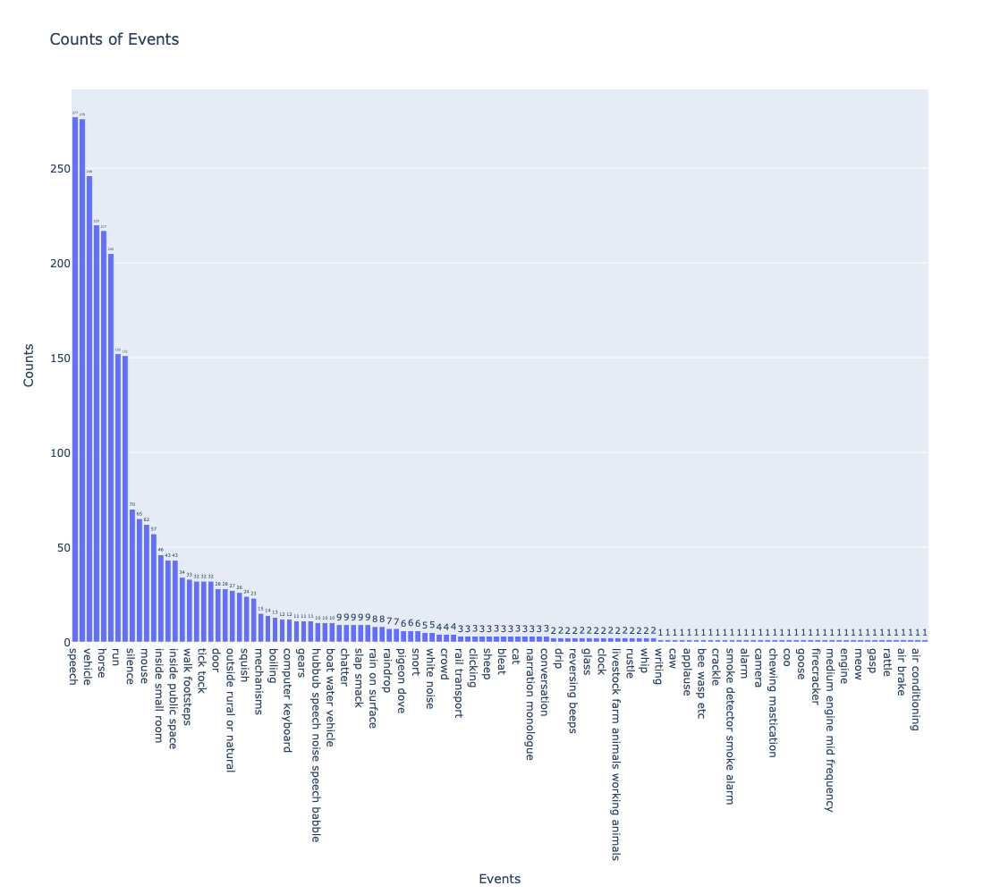

In [30]:
import plotly.express as px
# Create a bar plot using Plotly
fig = px.bar(
    sorted_df,
    x='Events',
    y='Counts',
    title='Counts of Events',
    text='Counts'
)

# Update the layout to make the text annotations more readable
fig.update_traces(texttemplate='%{text}', textposition='outside')

fig.update_layout(
    xaxis_title='Events',
    yaxis_title='Counts',
    height = 1000,
    width = 1000,
    showlegend=False  # Hide the legend
)

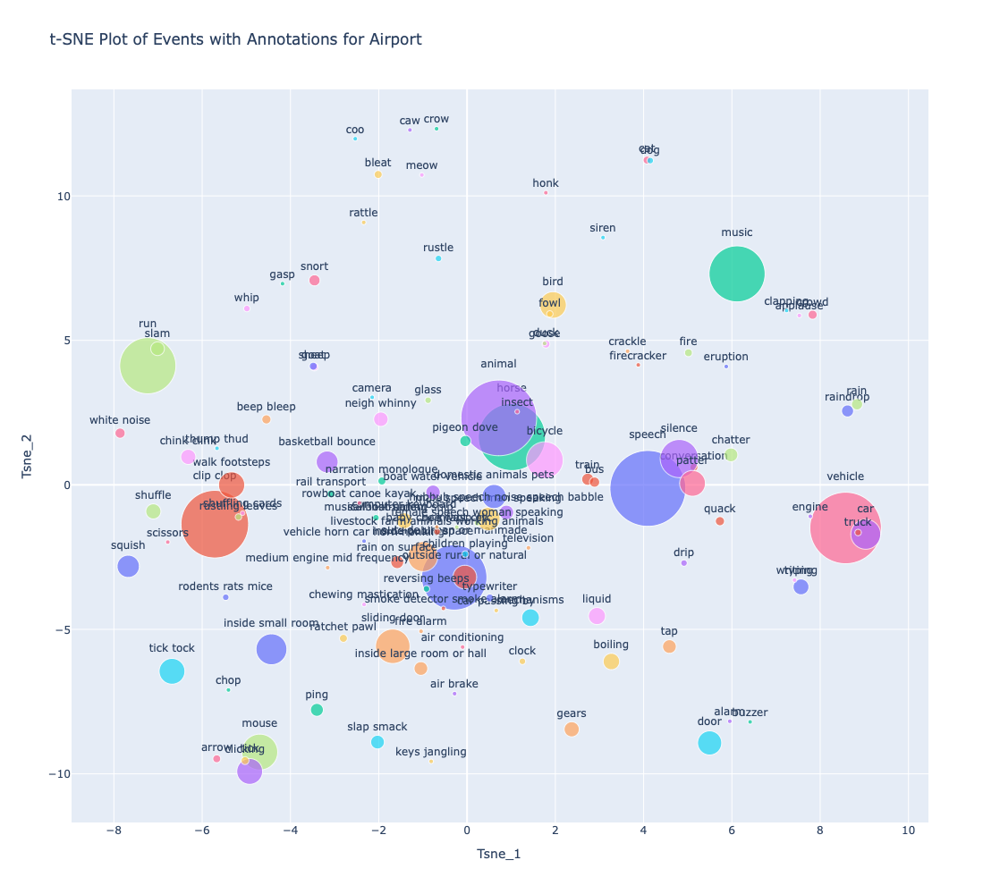

In [31]:
import plotly.express as px

# Create a scatter plot using Plotly
fig = px.scatter(
    airport_events_df,
    x='Tsne_1',
    y='Tsne_2',
    size='Counts',
    color='Events',
    hover_name='Events',
    text='Events',
    title='Scatter Plot of Events with t-SNE Coordinates',
    size_max=60  # Control the maximum size of the bubbles
)

# Update the layout to make the text annotations more readable
fig.update_traces(textposition='top center')

fig.update_layout(
    title='t-SNE Plot of Events with Annotations for Airport',
    xaxis_title='Tsne_1',
    yaxis_title='Tsne_2',
    showlegend=False,  # Hide the legend if it overlaps with the bubbles
    height = 1000,
    width = 1000,
)

# Show the plot
fig.show()

In [32]:
# We can see there is a huge variation in the occurences of events. Hence we can try and visualize with only a subset of events.
# dropping events less than 10

subset_airport_events_df = airport_events_df[airport_events_df['Counts'] >=20].reset_index(drop=True)
subset_airport_events_df.head()

,Events,Counts,Tsne_1,Tsne_2
0,speech,277,4.095692,-0.122517
1,clip clop,220,-5.714009,-1.359867
2,horse,217,1.016096,1.656481
3,animal,276,0.718779,2.318911
4,vehicle,246,8.575795,-1.491501


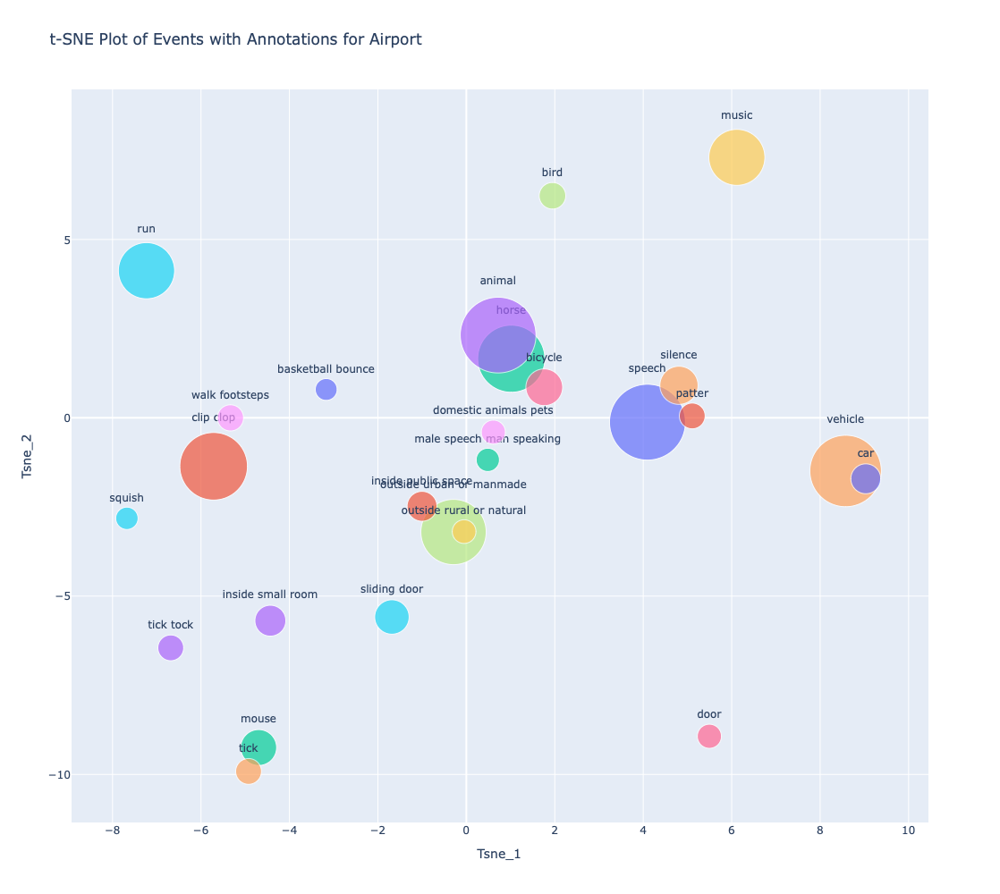

In [33]:
import plotly.express as px

# Create a scatter plot using Plotly
fig = px.scatter(
    subset_airport_events_df,
    x='Tsne_1',
    y='Tsne_2',
    size='Counts',
    color='Events',
    hover_name='Events',
    text='Events',
    title='Scatter Plot of Events with t-SNE Coordinates',
    size_max=60  # Control the maximum size of the bubbles
)

# Update the layout to make the text annotations more readable
fig.update_traces(textposition='top center')

fig.update_layout(
    title='t-SNE Plot of Events with Annotations for Airport',
    xaxis_title='Tsne_1',
    yaxis_title='Tsne_2',
    showlegend=False,  # Hide the legend if it overlaps with the bubbles
    height = 1000,
    width = 1000,
)

# Show the plot
fig.show()

## STREET PEDESTRIAN

In [24]:
# Now groupwise representing important events for the scene street_pedestrian
street_pedestrian_df = events_df.groupby("Predicted Label").get_group("street_pedestrian")
print(street_pedestrian_df.shape)
street_pedestrian_df.head()

(305, 7)


,Filename,Predicted Label,Actual Label,events_before,events_after,cam_pred_labels,not_common
0,/work/aistwal/dataset_tau2019/extracted-files/...,street_pedestrian,street_pedestrian,"[Speech, Clip-clop, Animal, Run, Horse, Outsid...","[Speech, Clip-clop, Animal, Run, Horse, Outsid...",street_pedestrian,set()
2,/work/aistwal/dataset_tau2019/extracted-files/...,street_pedestrian,street_pedestrian,"[Speech, Music, Vehicle, Chatter, Outside, urb...","[Speech, Music, Vehicle, Outside, urban or man...",street_pedestrian,"{'Inside, large room or hall', 'Crowd', 'Chatt..."
8,/work/aistwal/dataset_tau2019/extracted-files/...,street_pedestrian,street_pedestrian,"[Speech, Outside, urban or manmade, Hubbub, sp...","[Speech, Slap, smack, Outside, urban or manmad...",street_pedestrian,"{'Clip-clop', 'Chatter', 'Hubbub, speech noise..."
13,/work/aistwal/dataset_tau2019/extracted-files/...,street_pedestrian,street_pedestrian,"[Speech, Clip-clop, Animal, Horse, Outside, ur...","[Speech, Outside, urban or manmade, Animal, Ho...",street_pedestrian,"{'Hubbub, speech noise, speech babble', 'Walk,..."
21,/work/aistwal/dataset_tau2019/extracted-files/...,street_pedestrian,street_pedestrian,"[Speech, Animal, Clip-clop, Horse, Vehicle, Si...","[Speech, Animal, Vehicle, Silence, Horse, Clip...",street_pedestrian,"{'Run', 'Outside, rural or natural'}"


In [25]:
# Get all unique events in column events_after and plot them using their tsne coordinates. 
# Increase the marker shape based on count of the events
street_pedestrian_df = street_pedestrian_df.reset_index(drop=True)

# Flatten the list of lists to a single list of events
street_pedestrian_events = [event for sublist in street_pedestrian_df['events_after'] for event in sublist]
print("Total number of events: ", len(street_pedestrian_events))

# Get unique events
unique_events_after = set(street_pedestrian_events)
print("Total number of unique events_after: ", len(unique_events_after))

final_events_list = list(street_pedestrian_events)

# Preprocess events
final_events_list = [preprocess_event(event) for event in final_events_list]
len(final_events_list)

Total number of events:  3050
Total number of unique events_after:  107


3050

In [26]:
# Count all the occurences of the events
from collections import Counter
eventcount = Counter(final_events_list)
eventcount['speech']

303

In [27]:
counts = []
tsne_1 = []
tsne_2 = []
for events, count in eventcount.items():
    counts.append(count)
    tsne_1.append(embedding_df.loc[embedding_df['Events'] == events, 'tsne-2d-one'].item())
    tsne_2.append(embedding_df.loc[embedding_df['Events'] == events, 'tsne-2d-two'].item())

street_pedestrian_events_df = pd.DataFrame({
    "Events":list(eventcount.keys()),
    "Counts":counts,
    "Tsne_1":tsne_1,
    "Tsne_2":tsne_2
})

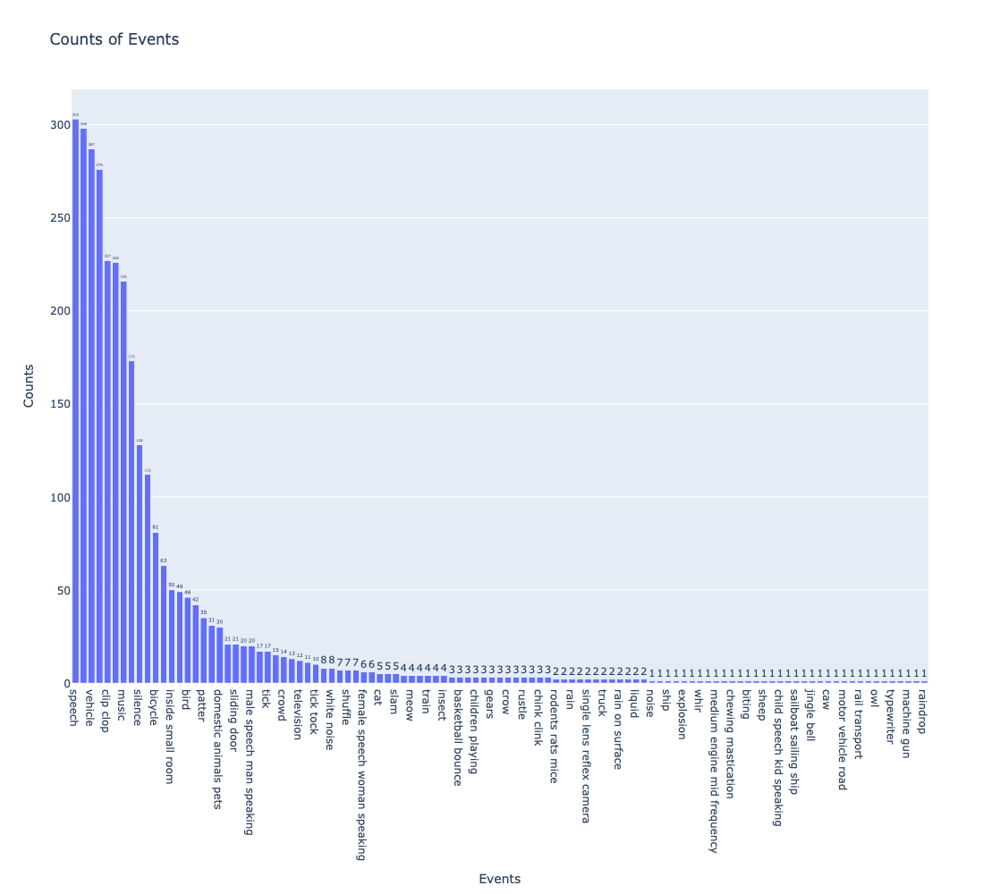

In [28]:
sorted_df = street_pedestrian_events_df.sort_values(by = ['Counts'], ascending=False)


#Plot
import plotly.express as px
# Create a bar plot using Plotly
fig = px.bar(
    sorted_df,
    x='Events',
    y='Counts',
    title='Counts of Events',
    text='Counts'
)

# Update the layout to make the text annotations more readable
fig.update_traces(texttemplate='%{text}', textposition='outside')

fig.update_layout(
    xaxis_title='Events',
    yaxis_title='Counts',
    height = 1000,
    width = 1000,
    showlegend=False  # Hide the legend
)

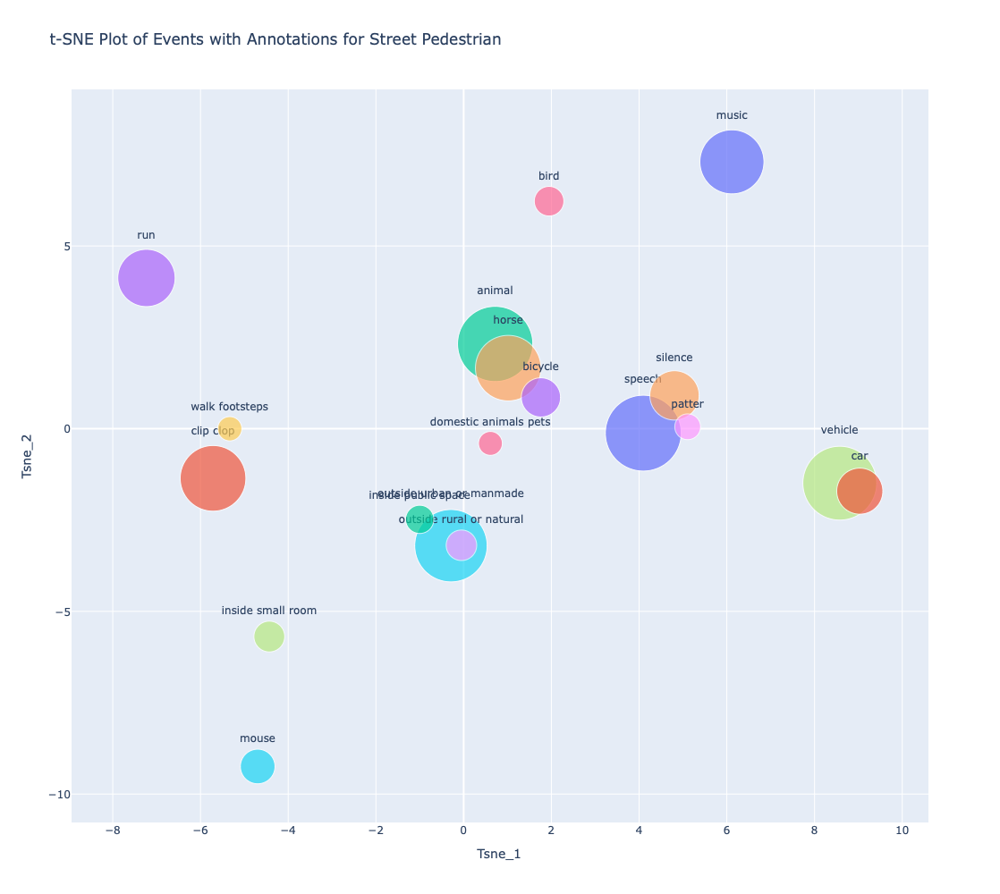

In [30]:
# Out of 305 audios in the street_pedestrian group there are many events below the occurence of 9 which we can remove and see
subset_street_pedestrian_events_df= street_pedestrian_events_df[street_pedestrian_events_df['Counts'] >=30].reset_index(drop=True)
subset_street_pedestrian_events_df= street_pedestrian_events_df[street_pedestrian_events_df['Counts'] >=30].reset_index(drop=True)


# Plot
# dropping events less than 10
import plotly.express as px

# Create a scatter plot using Plotly
fig = px.scatter(
    subset_street_pedestrian_events_df,
    x='Tsne_1',
    y='Tsne_2',
    size='Counts',
    color='Events',
    hover_name='Events',
    text='Events',
    title='Scatter Plot of Events with t-SNE Coordinates',
    size_max=60  # Control the maximum size of the bubbles
)

# Update the layout to make the text annotations more readable
fig.update_traces(textposition='top center')

fig.update_layout(
    title='t-SNE Plot of Events with Annotations for Street Pedestrian',
    xaxis_title='Tsne_1',
    yaxis_title='Tsne_2',
    showlegend=False,  # Hide the legend if it overlaps with the bubbles
    height = 1000,
    width = 1000,
)

# Show the plot
fig.show()


airport scene has a more concentrated human activity cluster, possibly due to the confined spaces and higher density of people.

inside large room sounds are not there unlike airport

"speech," "vehicle," and "walk footsteps" are central in both scenes, highlighting the nature of human-dominated environments.


## TRAM

In [18]:
# Now groupwise representing important events for the scene tram
tram_df = events_df.groupby("Predicted Label").get_group("tram")

tram_df.head()
# tram_df = tram_df[tram_df['cam_pred_labels'] == 'tram']
print(tram_df.shape)

(298, 7)


In [19]:
#Getting all the event the model tries to ignore for tram
all_ignored = []
for ignored_events in tram_df['not_common']:
    ignored_events = ast.literal_eval(ignored_events)
    all_ignored.append(list(ignored_events))
flattenedlist = list(itertools.chain.from_iterable(all_ignored))
Counter(flattenedlist)

Counter({'Train': 64,
         'Field recording': 62,
         'Rail transport': 56,
         'Railroad car, train wagon': 55,
         'Aircraft': 33,
         'Boat, Water vehicle': 29,
         'Inside, small room': 29,
         'Outside, rural or natural': 27,
         'Subway, metro, underground': 20,
         'Fixed-wing aircraft, airplane': 20,
         'Ship': 16,
         'Rumble': 16,
         'Air brake': 15,
         'Outside, urban or manmade': 14,
         'Mouse': 14,
         'Bird': 12,
         'Cupboard open or close': 12,
         'Pigeon, dove': 11,
         'Female speech, woman speaking': 10,
         'Motor vehicle (road)': 9,
         'Door': 8,
         'Sliding door': 8,
         'Animal': 8,
         'Clickety-clack': 7,
         'Coo': 7,
         'Narration, monologue': 7,
         'Traffic noise, roadway noise': 6,
         'Bus': 6,
         'Drawer open or close': 6,
         'Hubbub, speech noise, speech babble': 6,
         'Music': 6,
         'Music

In [20]:
# Get all unique events in column events_after and plot them using their tsne coordinates. 
# Increase the marker shape based on count of the events
tram_df = tram_df.reset_index(drop=True)

# Flatten the list of lists to a single list of events
tram_events = [event for sublist in tram_df['events_after'] for event in sublist]
print("Total number of events: ", len(tram_events))

# Get unique events
unique_events_after = set(tram_events)
print("Total number of unique events_after: ", len(unique_events_after))

final_events_list = list(tram_events)

# Preprocess events
final_events_list = [preprocess_event(event) for event in final_events_list]
len(final_events_list)

Total number of events:  2980
Total number of unique events_after:  134


2980

In [21]:
# Count all the occurences of the events
from collections import Counter
eventcount = Counter(final_events_list)
print("speech :", eventcount['speech'])




counts = []
tsne_1 = []
tsne_2 = []
for events, count in eventcount.items():
    counts.append(count)
    tsne_1.append(embedding_df.loc[embedding_df['Events'] == events, 'tsne-2d-one'].item())
    tsne_2.append(embedding_df.loc[embedding_df['Events'] == events, 'tsne-2d-two'].item())

tram_events_df = pd.DataFrame({
    "Events":list(eventcount.keys()),
    "Counts":counts,
    "Tsne_1":tsne_1,
    "Tsne_2":tsne_2
})

sorted_df = tram_events_df.sort_values(by = ['Counts'], ascending=False)

speech : 279


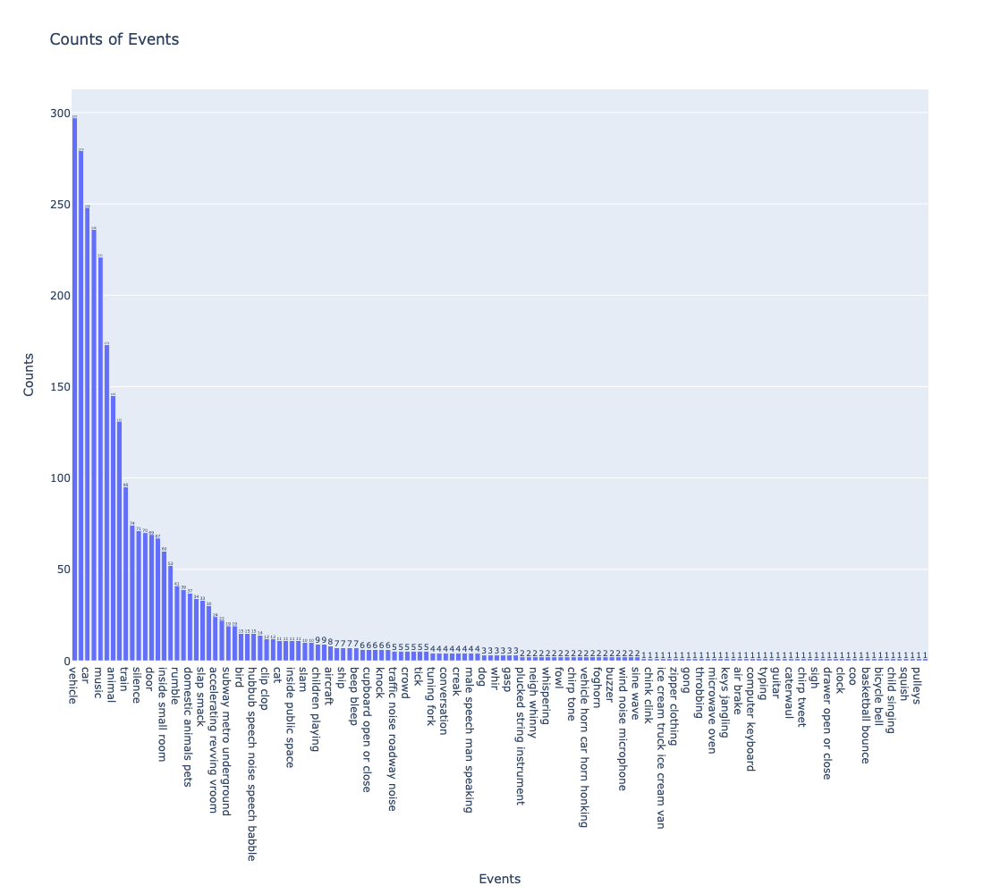

In [22]:
#Plot
import plotly.express as px
# Create a bar plot using Plotly
fig = px.bar(
    sorted_df,
    x='Events',
    y='Counts',
    title='Counts of Events',
    text='Counts'
)

# Update the layout to make the text annotations more readable
fig.update_traces(texttemplate='%{text}', textposition='outside')

fig.update_layout(
    xaxis_title='Events',
    yaxis_title='Counts',
    height = 1000,
    width = 1000,
    showlegend=False  # Hide the legend
)

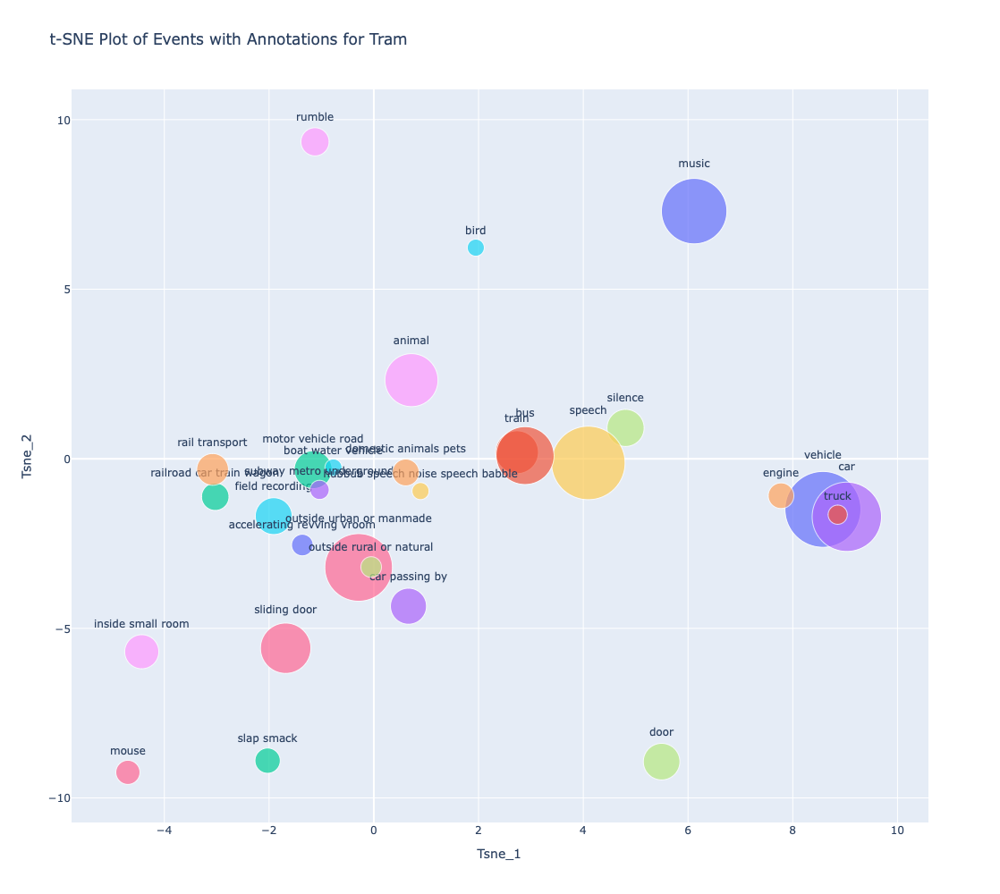

In [23]:
subset_tram_df = tram_events_df[tram_events_df['Counts'] >=15].reset_index(drop=True)


# Plot
# dropping events less than 10
import plotly.express as px

# Create a scatter plot using Plotly
fig = px.scatter(
    subset_tram_df,
    x='Tsne_1',
    y='Tsne_2',
    size='Counts',
    color='Events',
    hover_name='Events',
    text='Events',
    title='Scatter Plot of Events with t-SNE Coordinates',
    size_max=60  # Control the maximum size of the bubbles
)

# Update the layout to make the text annotations more readable
fig.update_traces(textposition='top center')

fig.update_layout(
    title='t-SNE Plot of Events with Annotations for Tram',
    xaxis_title='Tsne_1',
    yaxis_title='Tsne_2',
    showlegend=False,  # Hide the legend if it overlaps with the bubbles
    height = 1000,
    width = 1000,
)

# Show the plot
fig.show()

Model tends to focus on active events like rumble, door, tram, railroad, wagon, bus, or some cluster of vehicle related sounds, which is different
from those of airport and street pedestrian. The model also focuses on indoor events.

In [59]:
# array(['airport', 'bus', 'metro', 'metro_station', 'park',
#        'public_square', 'shopping_mall', 'street_pedestrian',
#        'street_traffic', 'tram'], dtype=object)

## Metro Station

152 records of metro station

In [26]:
# Now groupwise representing important events for the scene street_pedestrian
metro_station_df = events_df.groupby("Predicted Label").get_group("metro_station")
print(metro_station_df.shape)
metro_station_df.head()

(152, 7)


,Filename,Predicted Label,Actual Label,events_before,events_after,cam_pred_labels,not_common
5,/work/aistwal/dataset_tau2019/extracted-files/...,metro_station,metro_station,"[Train, Vehicle, Railroad car, train wagon, Ra...","[Vehicle, Train, Field recording, Rail transpo...",metro_station,"{'Air brake', 'Subway, metro, underground', 'T..."
10,/work/aistwal/dataset_tau2019/extracted-files/...,metro_station,metro_station,"[Speech, Vehicle, Train, Rail transport, Mouse...","[Speech, Vehicle, Train, Rail transport, Mouse...",metro_station,set()
16,/work/aistwal/dataset_tau2019/extracted-files/...,metro_station,metro_station,"[Speech, Vehicle, Train, Rail transport, Railr...","[Snort, Vehicle, Speech, Gasp, Car, Animal, Bu...",metro_station,"{'Railroad car, train wagon', 'Rail transport'..."
72,/work/aistwal/dataset_tau2019/extracted-files/...,metro_station,metro_station,"[Vehicle, Train, Railroad car, train wagon, Ra...","[Vehicle, Car, Snort, Bus, Gasp, Music, Car pa...",metro_station,"{'Train', 'Air brake', 'Subway, metro, undergr..."
119,/work/aistwal/dataset_tau2019/extracted-files/...,metro_station,metro_station,"[Train, Railroad car, train wagon, Rail transp...","[Vehicle, Train, Rail transport, Railroad car,...",metro_station,"{'Music', 'Clickety-clack', 'Outside, rural or..."


In [27]:
# Get all unique events in column events_after and plot them using their tsne coordinates. 
# Increase the marker shape based on count of the events
metro_station_df = metro_station_df.reset_index(drop=True)

# Flatten the list of lists to a single list of events
metro_station_events = [event for sublist in metro_station_df['events_after'] for event in sublist]
print("Total number of events: ", len(metro_station_events))

# Get unique events
unique_events_after = set(metro_station_events)
print("Total number of unique events_after: ", len(unique_events_after))

final_events_list = list(metro_station_events)

# Preprocess events
final_events_list = [preprocess_event(event) for event in final_events_list]
len(final_events_list)

Total number of events:  1520
Total number of unique events_after:  94


1520

In [28]:
# Count all the occurences of the events
from collections import Counter
eventcount = Counter(final_events_list)
print("speech :", eventcount['speech'])




counts = []
tsne_1 = []
tsne_2 = []
for events, count in eventcount.items():
    counts.append(count)
    tsne_1.append(embedding_df.loc[embedding_df['Events'] == events, 'tsne-2d-one'].item())
    tsne_2.append(embedding_df.loc[embedding_df['Events'] == events, 'tsne-2d-two'].item())

metro_station_events_df = pd.DataFrame({
    "Events":list(eventcount.keys()),
    "Counts":counts,
    "Tsne_1":tsne_1,
    "Tsne_2":tsne_2
})

sorted_df = metro_station_events_df.sort_values(by = ['Counts'], ascending=False)

speech : 138


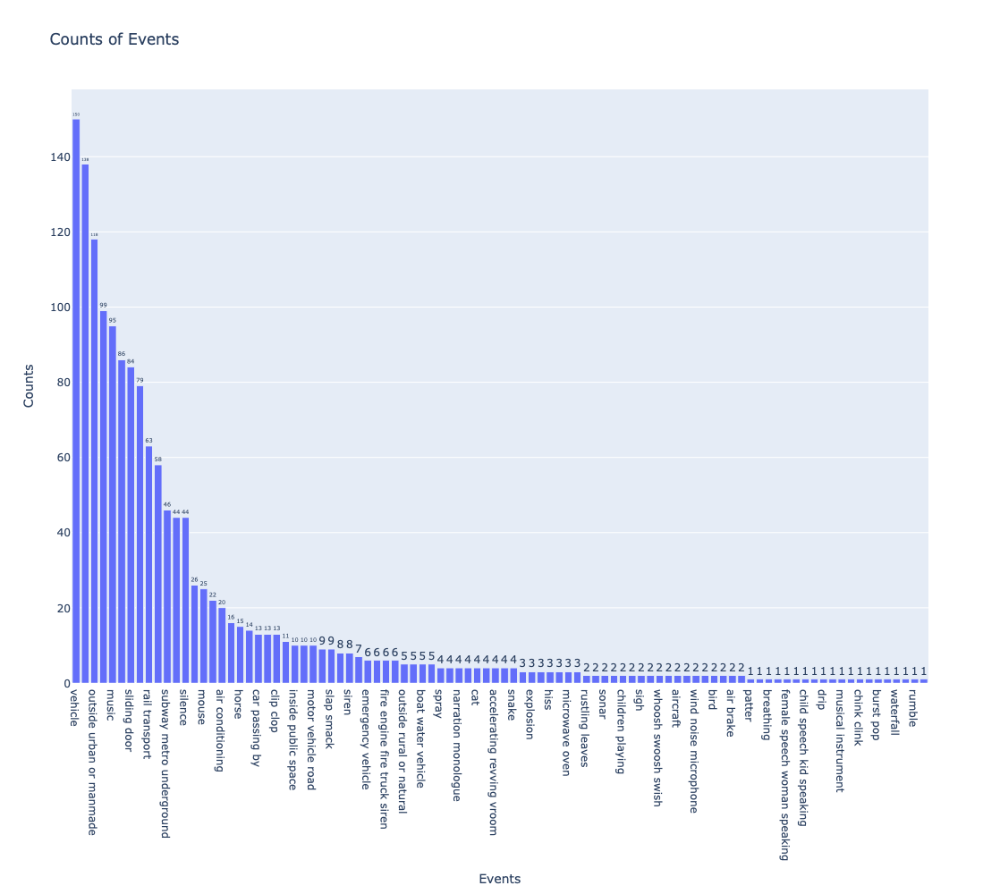

In [29]:
#Plot
import plotly.express as px
# Create a bar plot using Plotly
fig = px.bar(
    sorted_df,
    x='Events',
    y='Counts',
    title='Counts of Events',
    text='Counts'
)

# Update the layout to make the text annotations more readable
fig.update_traces(texttemplate='%{text}', textposition='outside')

fig.update_layout(
    xaxis_title='Events',
    yaxis_title='Counts',
    height = 1000,
    width = 1000,
    showlegend=False  # Hide the legend
)

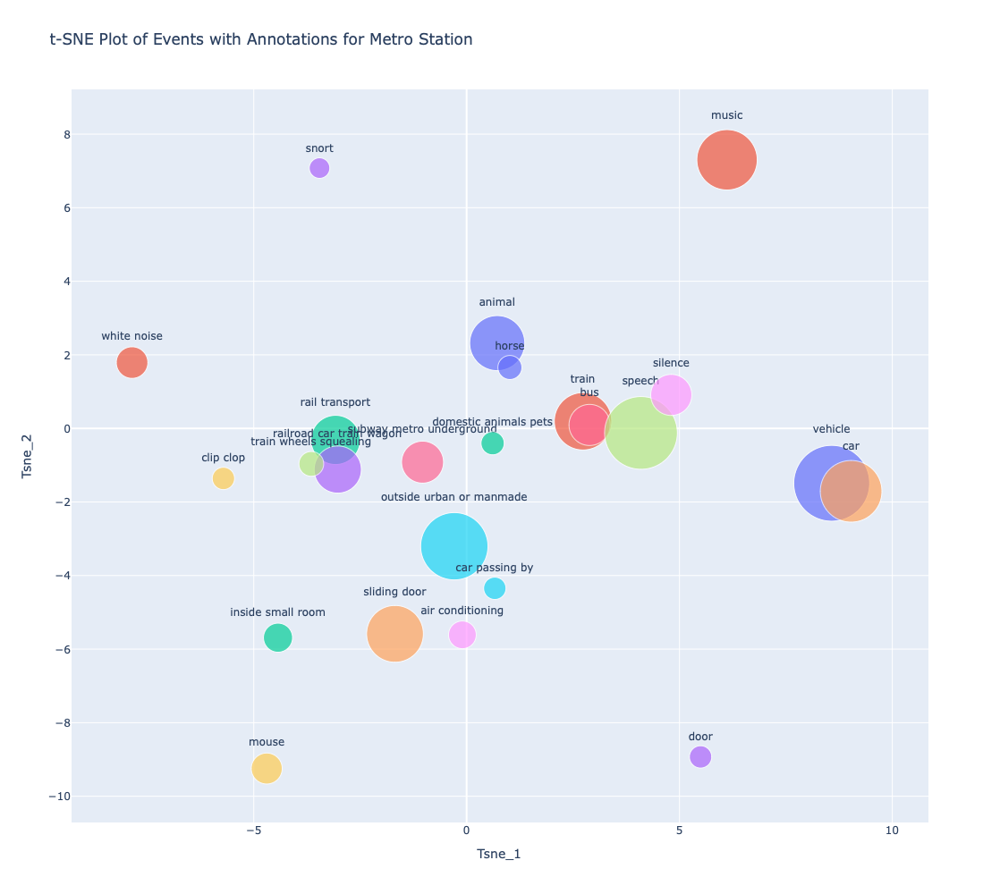

In [30]:
subset_metro_station_df = metro_station_events_df[metro_station_events_df['Counts'] >=11].reset_index(drop=True)


# Plot
# dropping events less than 10
import plotly.express as px

# Create a scatter plot using Plotly
fig = px.scatter(
    subset_metro_station_df,
    x='Tsne_1',
    y='Tsne_2',
    size='Counts',
    color='Events',
    hover_name='Events',
    text='Events',
    title='Scatter Plot of Events with t-SNE Coordinates',
    size_max=60  # Control the maximum size of the bubbles
)

# Update the layout to make the text annotations more readable
fig.update_traces(textposition='top center')

fig.update_layout(
    title='t-SNE Plot of Events with Annotations for Metro Station',
    xaxis_title='Tsne_1',
    yaxis_title='Tsne_2',
    showlegend=False,  # Hide the legend if it overlaps with the bubbles
    height = 1000,
    width = 1000,
)

# Show the plot
fig.show()

Major contributor events are related to vehicle categories, outside urban or man made, door sounds, speech, music, subway metro underground which do sound like a metro station.

## STREET TRAFFIC

In [33]:
# Now groupwise representing important events for the scene street_traffic
street_traffic_df = events_df.groupby("Predicted Label").get_group("street_traffic")
print(street_traffic_df.shape)
street_traffic_df.head()

(359, 7)


,Filename,Predicted Label,Actual Label,events_before,events_after,cam_pred_labels,not_common
3,/work/aistwal/dataset_tau2019/extracted-files/...,street_traffic,street_traffic,"[Vehicle, White noise, Silence, Car, Train, Sp...","[White noise, Vehicle, Mouse, Silence, Speech,...",street_traffic,"{'Train', 'Inside, small room', 'Rustle'}"
6,/work/aistwal/dataset_tau2019/extracted-files/...,street_traffic,street_traffic,"[Vehicle, Chink, clink, Bus, Car, Arrow, Dishe...","[Vehicle, Car, Outside, urban or manmade, Car ...",street_traffic,"{'Train', 'Chink, clink', 'Arrow', 'Cupboard o..."
24,/work/aistwal/dataset_tau2019/extracted-files/...,street_traffic,street_traffic,"[Vehicle, Animal, Mouse, Silence, Speech, Whit...","[Vehicle, Animal, Speech, Mouse, Silence, Musi...",street_traffic,"{'Inside, small room', 'Bird', 'Boat, Water ve..."
35,/work/aistwal/dataset_tau2019/extracted-files/...,street_traffic,street_traffic,"[Vehicle, Car, Truck, Bus, Silence, Mouse, Out...","[Vehicle, Car, Mouse, Animal, Outside, urban o...",street_traffic,"{'Air brake', 'Truck', 'Traffic noise, roadway..."
37,/work/aistwal/dataset_tau2019/extracted-files/...,street_traffic,street_traffic,"[Vehicle, Car, Silence, Outside, rural or natu...","[Vehicle, Car, Animal, Outside, urban or manma...",street_traffic,"{'Rustle', 'Silence', 'Outside, rural or natur..."


In [34]:
# Get all unique events in column events_after and plot them using their tsne coordinates. 
# Increase the marker shape based on count of the events
street_traffic_df = street_traffic_df.reset_index(drop=True)

# Flatten the list of lists to a single list of events
street_traffic_events = [event for sublist in street_traffic_df['events_after'] for event in sublist]
print("Total number of events: ", len(street_traffic_events))

# Get unique events
unique_events_after = set(street_traffic_events)
print("Total number of unique events_after: ", len(unique_events_after))

final_events_list = list(street_traffic_events)

# Preprocess events
final_events_list = [preprocess_event(event) for event in final_events_list]
len(final_events_list)

Total number of events:  3590
Total number of unique events_after:  101


3590

In [35]:
# Count all the occurences of the events
from collections import Counter
eventcount = Counter(final_events_list)
print("speech :", eventcount['speech'])




counts = []
tsne_1 = []
tsne_2 = []
for events, count in eventcount.items():
    counts.append(count)
    tsne_1.append(embedding_df.loc[embedding_df['Events'] == events, 'tsne-2d-one'].item())
    tsne_2.append(embedding_df.loc[embedding_df['Events'] == events, 'tsne-2d-two'].item())

street_traffic_events_df = pd.DataFrame({
    "Events":list(eventcount.keys()),
    "Counts":counts,
    "Tsne_1":tsne_1,
    "Tsne_2":tsne_2
})

sorted_df = street_traffic_events_df.sort_values(by = ['Counts'], ascending=False)

speech : 332


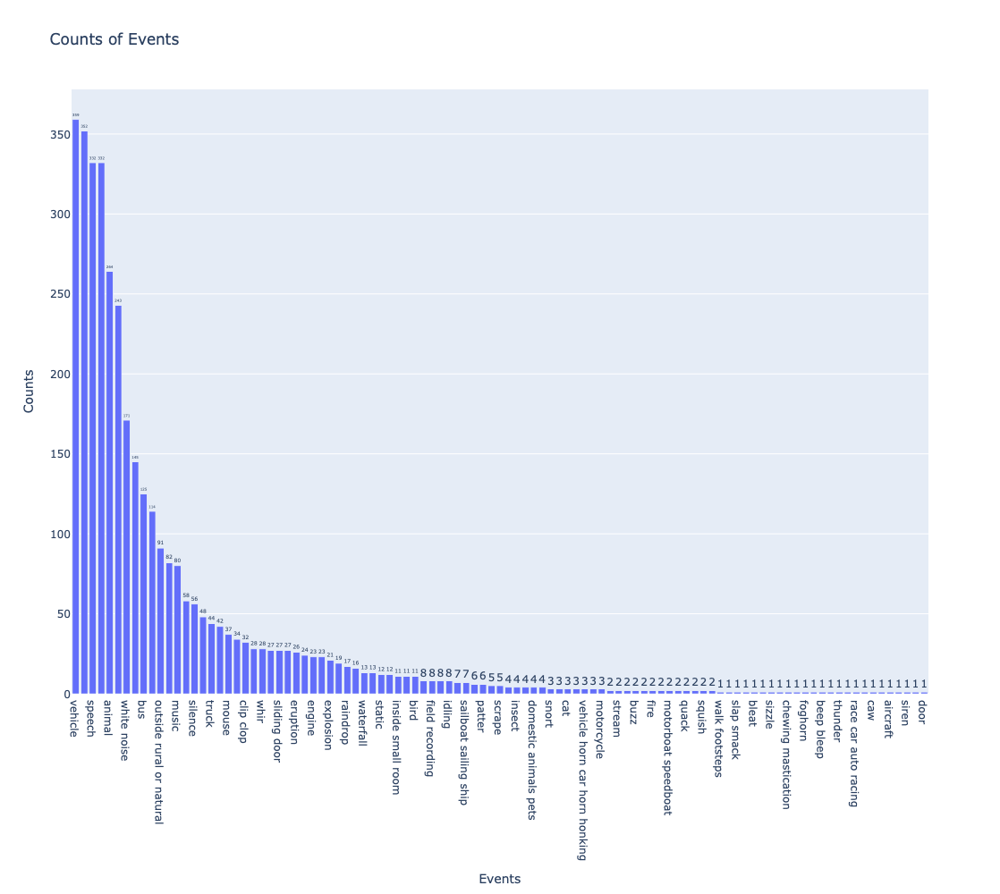

In [36]:
#Plot
import plotly.express as px
# Create a bar plot using Plotly
fig = px.bar(
    sorted_df,
    x='Events',
    y='Counts',
    title='Counts of Events',
    text='Counts'
)

# Update the layout to make the text annotations more readable
fig.update_traces(texttemplate='%{text}', textposition='outside')

fig.update_layout(
    xaxis_title='Events',
    yaxis_title='Counts',
    height = 1000,
    width = 1000,
    showlegend=False  # Hide the legend
)

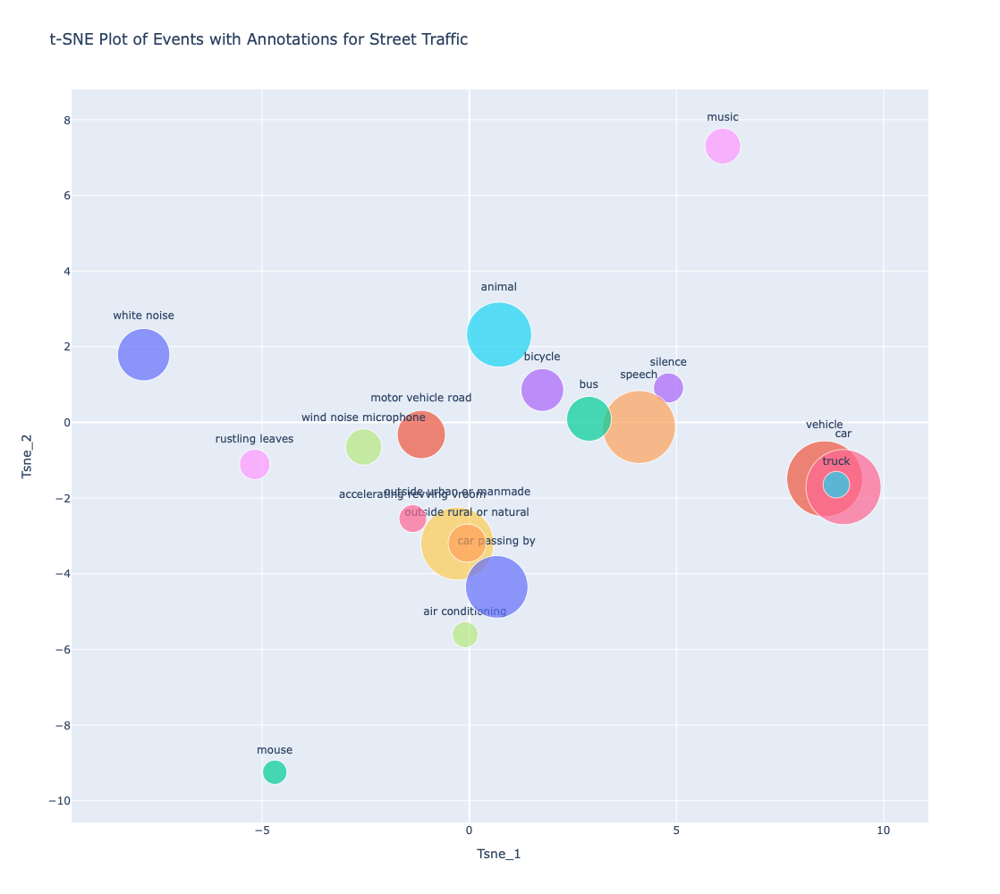

In [37]:
subset_street_traffic_events_df = street_traffic_events_df[street_traffic_events_df['Counts'] >=35].reset_index(drop=True)


# Plot
# dropping events less than 10
import plotly.express as px

# Create a scatter plot using Plotly
fig = px.scatter(
    subset_street_traffic_events_df,
    x='Tsne_1',
    y='Tsne_2',
    size='Counts',
    color='Events',
    hover_name='Events',
    text='Events',
    title='Scatter Plot of Events with t-SNE Coordinates',
    size_max=60  # Control the maximum size of the bubbles
)

# Update the layout to make the text annotations more readable
fig.update_traces(textposition='top center')

fig.update_layout(
    title='t-SNE Plot of Events with Annotations for Street Traffic',
    xaxis_title='Tsne_1',
    yaxis_title='Tsne_2',
    showlegend=False,  # Hide the legend if it overlaps with the bubbles
    height = 1000,
    width = 1000,
)

# Show the plot
fig.show()